In [1]:
!pip install huggingface_hub diffusers sentencepiece protobuf transformers accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.4/515.4 kB 70.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 130.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 197.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.1/321.1 kB 118.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 235.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.3/365.3 kB 118.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 77.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 216.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 175.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
from huggingface_hub import notebook_login
notebook_login()

In [1]:
import torch
from flux_pipeline_dpm import FluxPipeline
from diffusers.schedulers import FlowMatchEulerDiscreteScheduler, DPMSolverMultistepScheduler



pipe = FluxPipeline.from_pretrained('black-forest-labs/FLUX.1-dev', torch_dtype=torch.bfloat16)
euler_scheduler = pipe.scheduler
dpm_scheduler = DPMSolverMultistepScheduler.from_pretrained('Efficient-Large-Model/SANA1.5_1.6B_1024px_diffusers', subfolder='scheduler')

pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

FluxPipeline {
  "_class_name": "FluxPipeline",
  "_diffusers_version": "0.34.0",
  "_name_or_path": "black-forest-labs/FLUX.1-dev",
  "feature_extractor": [
    null,
    null
  ],
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "FluxTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [2]:
## baseline
pipe.scheduler = euler_scheduler
out = pipe(
    prompt="An oil painting of a light house in a stormy sea, ships visible in the distance, lightning in the sky. 18th century style",
    height=1024,
    width=1024,
    guidance_scale=3.5,
    num_inference_steps=28,
    max_sequence_length=512,
    generator=torch.Generator("cpu").manual_seed(0)
).images[0]

  0%|          | 0/28 [00:00<?, ?it/s]

In [3]:
## baseline
pipe.scheduler = dpm_scheduler
out_dpm = pipe(
    prompt="An oil painting of a light house in a stormy sea, ships visible in the distance, lightning in the sky. 18th century style",
    height=1024,
    width=1024,
    guidance_scale=3.5,
    num_inference_steps=18,
    max_sequence_length=512,
    generator=torch.Generator("cpu").manual_seed(0)
).images[0]

  0%|          | 0/18 [00:00<?, ?it/s]

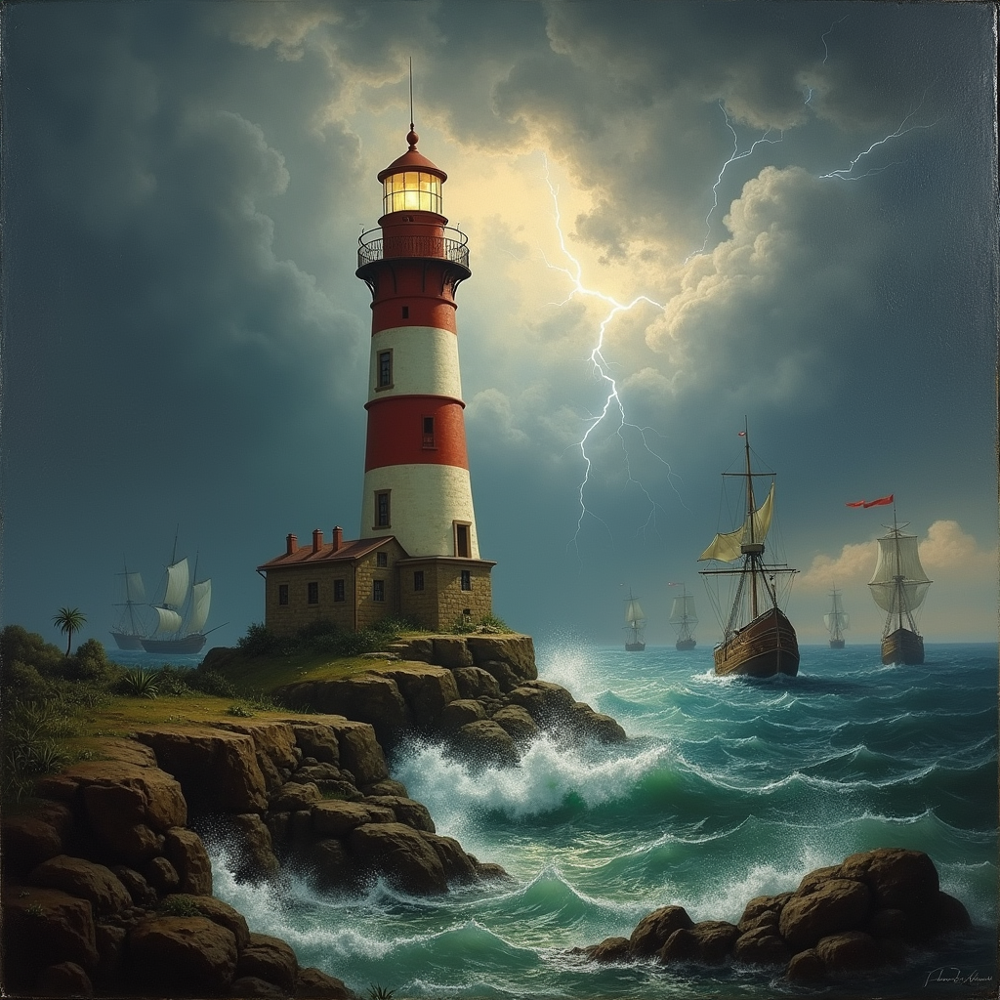

In [4]:
out

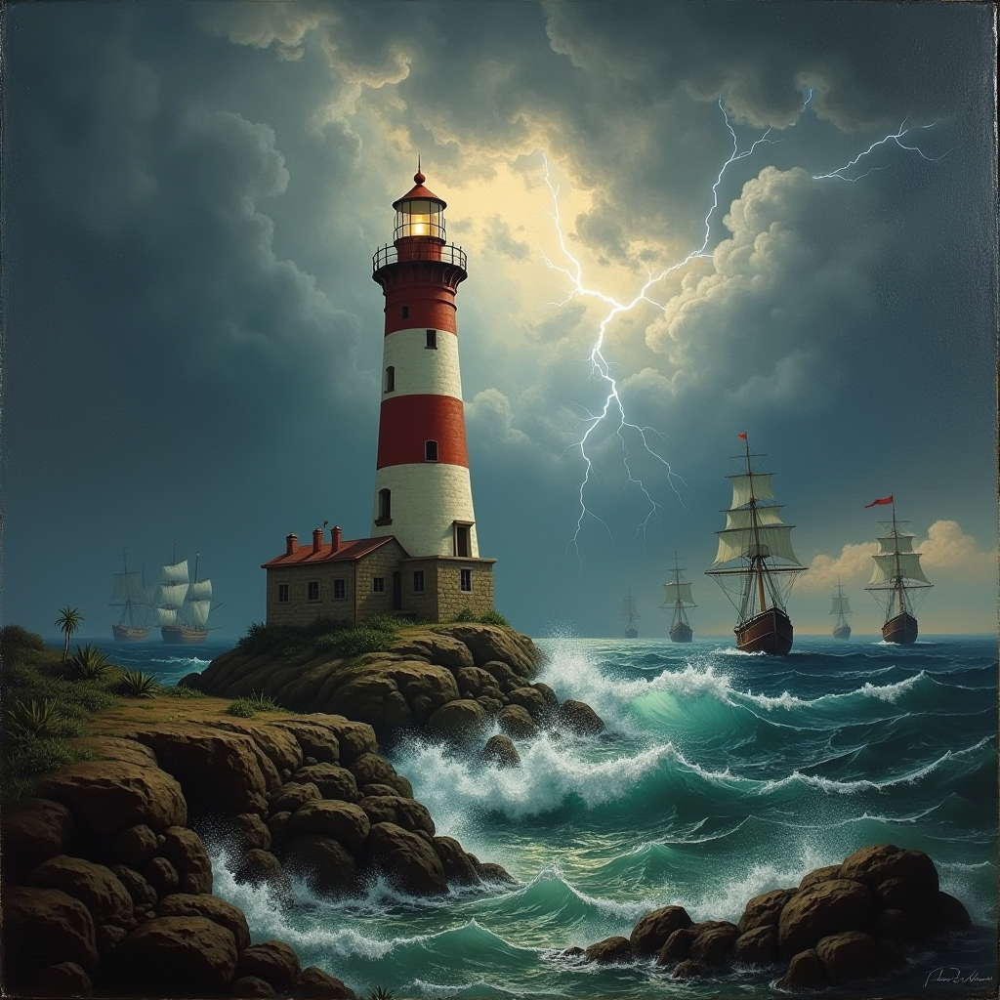

In [5]:
out_dpm

In [1]:
import torch
from flux_kontext_pipeline_dpm import FluxKontextPipeline
from diffusers.schedulers import FlowMatchEulerDiscreteScheduler, DPMSolverMultistepScheduler
from diffusers.utils import load_image

pipe = FluxKontextPipeline.from_pretrained("black-forest-labs/FLUX.1-Kontext-dev", torch_dtype=torch.bfloat16)
euler_scheduler = pipe.scheduler
dpm_scheduler = DPMSolverMultistepScheduler.from_pretrained('Efficient-Large-Model/SANA1.5_1.6B_1024px_diffusers', subfolder='scheduler')

pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

FluxKontextPipeline {
  "_class_name": "FluxKontextPipeline",
  "_diffusers_version": "0.34.0",
  "_name_or_path": "black-forest-labs/FLUX.1-Kontext-dev",
  "feature_extractor": [
    null,
    null
  ],
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "FluxTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [2]:
input_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png")

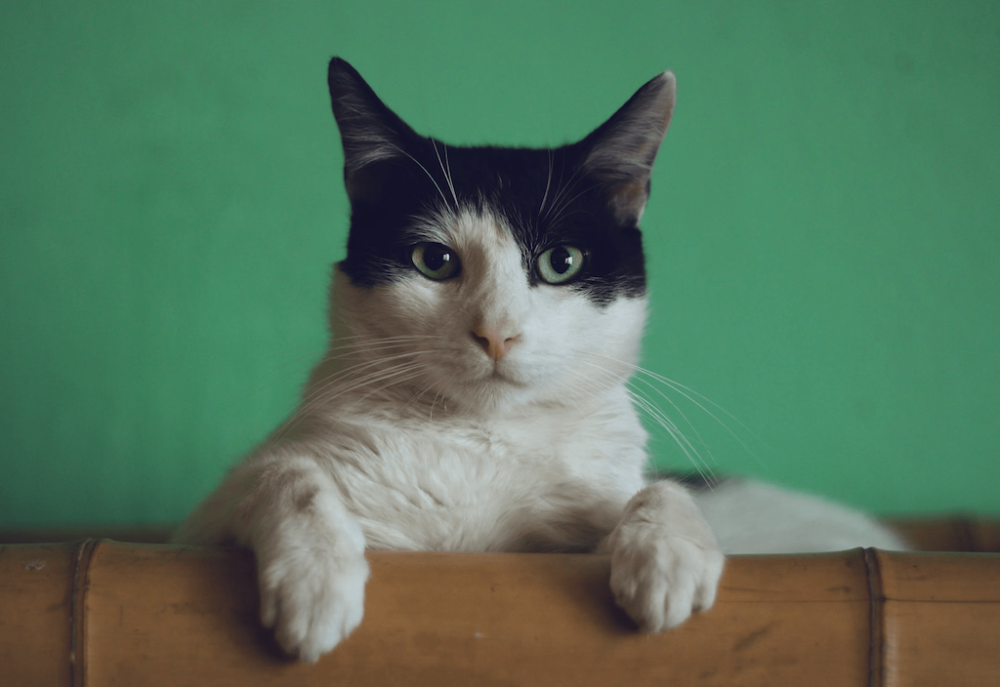

In [3]:
input_image

In [4]:
pipe.scheduler = euler_scheduler
image = pipe(
  image=input_image,
  prompt="Add a hat to the cat",
  guidance_scale=2.5,
  num_inference_steps=28,
).images[0]

  0%|          | 0/28 [00:00<?, ?it/s]

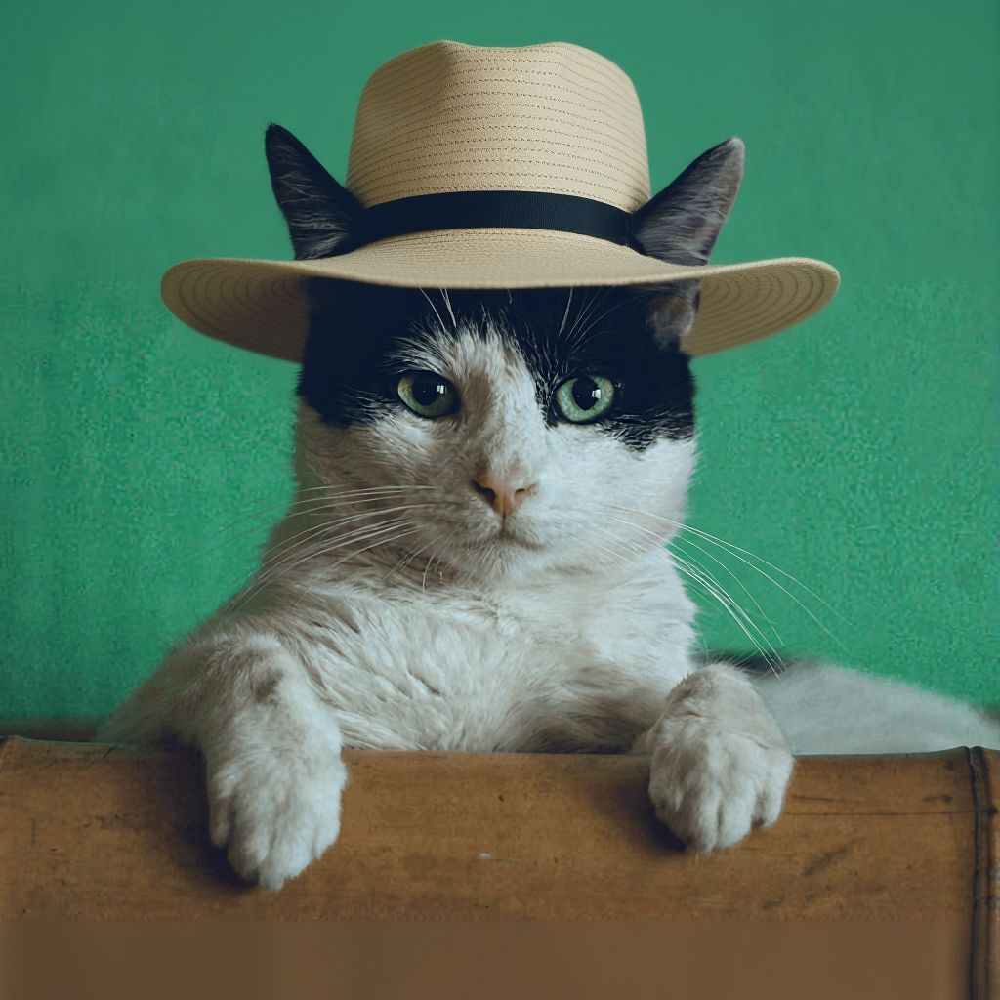

In [5]:
image

In [12]:
pipe.scheduler = dpm_scheduler
image_dpm = pipe(
  image=input_image,
  prompt="Add a hat to the cat",
  guidance_scale=2.5,
  num_inference_steps=20,
).images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

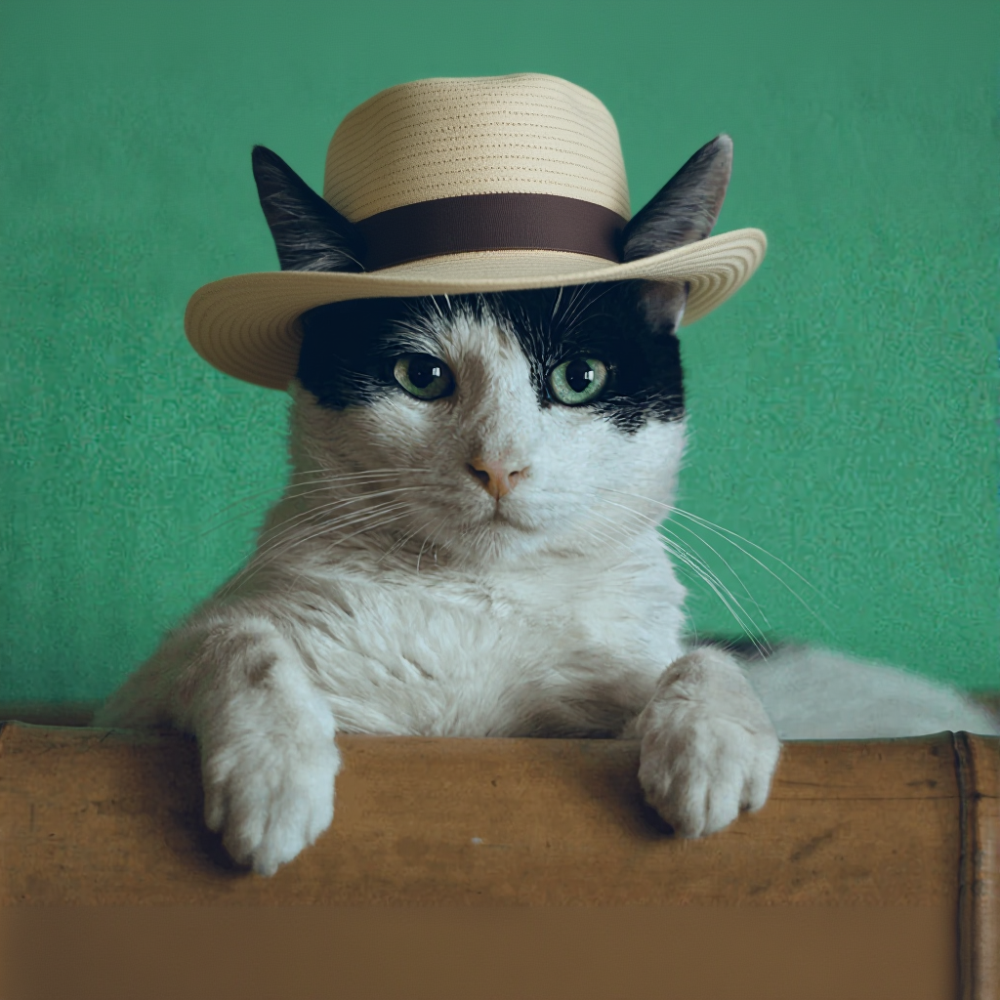

In [13]:
image_dpm

In [1]:
import torch 
from flux_kontext_inpaint_pipeline_dpm import FluxKontextInpaintPipeline
from diffusers.schedulers import FlowMatchEulerDiscreteScheduler, DPMSolverMultistepScheduler
from diffusers.utils import load_image

prompt = "Change the yellow dinosaur to green one"
pipe = FluxKontextInpaintPipeline.from_pretrained("black-forest-labs/FLUX.1-Kontext-dev", torch_dtype=torch.bfloat16)
pipe.to('cuda')

img_url = "https://github.com/ZenAI-Vietnam/Flux-Kontext-pipelines/blob/main/assets/dinosaur_input.jpeg?raw=true"
mask_url = "https://github.com/ZenAI-Vietnam/Flux-Kontext-pipelines/blob/main/assets/dinosaur_mask.png?raw=true"

source = load_image(img_url)
mask = load_image(mask_url)

euler_scheduler = pipe.scheduler
dpm_scheduler = DPMSolverMultistepScheduler.from_pretrained('Efficient-Large-Model/SANA1.5_1.6B_1024px_diffusers', subfolder='scheduler')

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

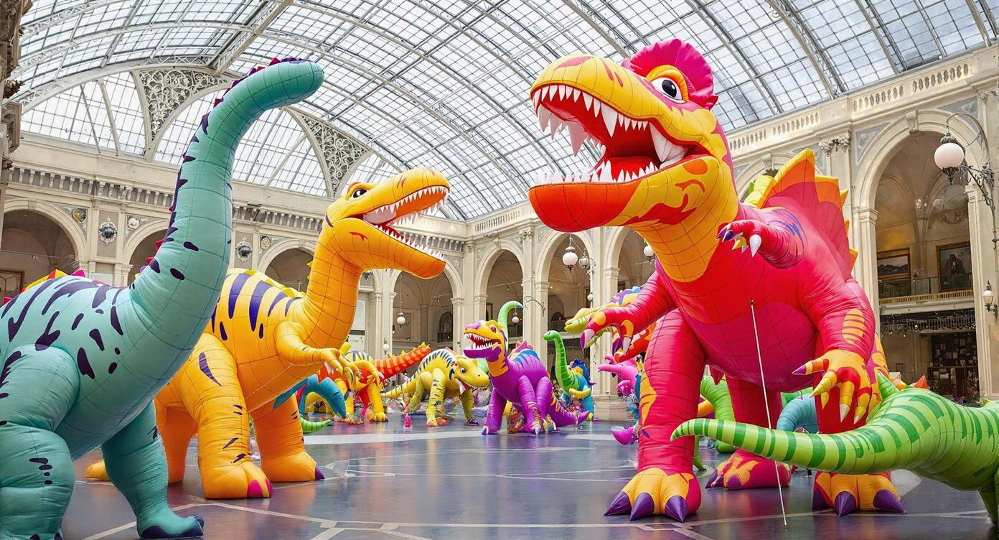

In [2]:
source

In [3]:
pipe.scheduler = euler_scheduler
image = pipe(
    prompt=prompt, 
    image=source,
    mask_image=mask,
    strength=1.0,
    num_inference_steps=28,
).images[0]

  0%|          | 0/28 [00:00<?, ?it/s]

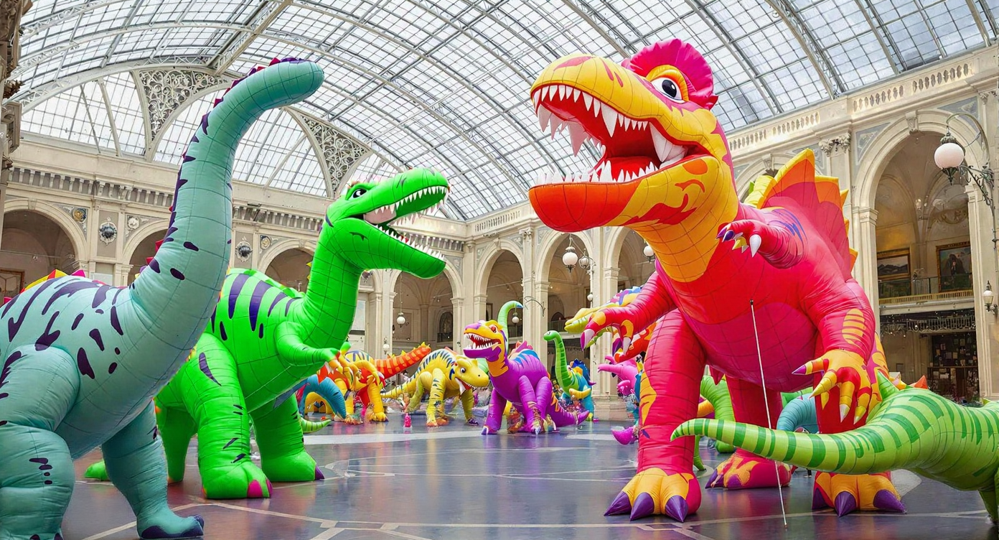

In [4]:
image

In [5]:
pipe.scheduler = dpm_scheduler
image_dpm = pipe(
    prompt=prompt, 
    image=source,
    mask_image=mask,
    strength=1.0,
    num_inference_steps=20,
).images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

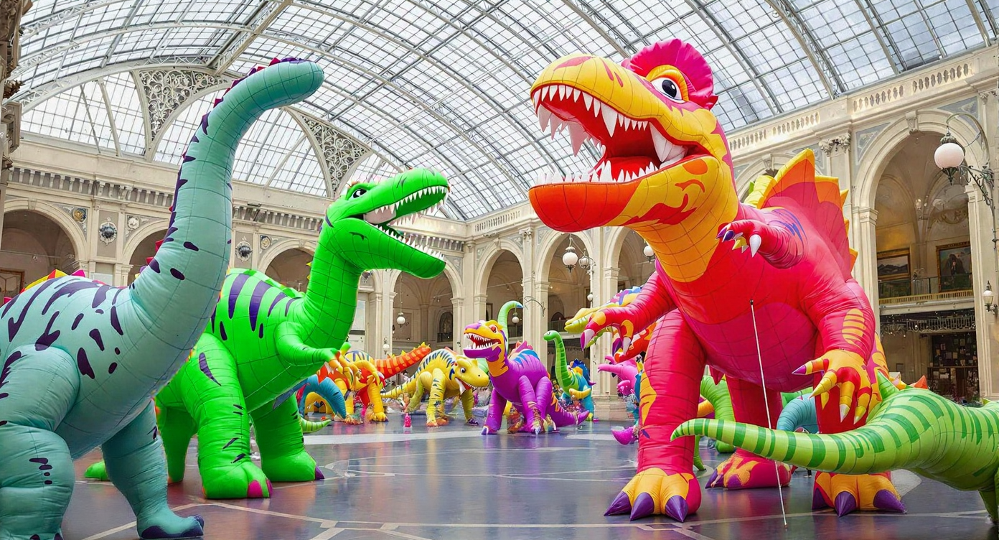

In [6]:
image_dpm